# Necessary Imports 

In [1]:
import numpy as np
import numpy.typing as npt
import seaborn as sns
import tifffile as tiff
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import os
import cv2
from scipy.stats import skew
import sys
import numpy.typing as npt


import hdbscan
import umap
import umap.plot


import torch
import torchvision
import gc


In [2]:
%load_ext autoreload
%autoreload 2


import importlib  
au = importlib.import_module("cell-AAP.cell_AAP.annotation.annotation_utils")
sys.path.append('/home/anishjv/cell_seg_classify/notebooks/cell-AAP/cell_AAP/annotation/')
sys.path.append('/home/anishjv/cell_seg_classify/notebooks/cell-AAP/')
ann = importlib.import_module("cell-AAP.cell_AAP.annotation.annotator")
dw = importlib.import_module("cell-AAP.cell_AAP.annotation.dataset_write")
cfg = importlib.import_module("cell-AAP.cell_AAP.configs")

# Model Info
Here is where you define the SAM model to be used

In [3]:
sys.path.append("..")
from segment_anything import sam_model_registry, SamPredictor
from segment_anything.modeling import Sam

#Code below should be run if file is not already saved in path 
#!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth

sam_checkpoint = "vit_l.pt"
model_type = "vit_l"
device = 'cuda'
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device = device)
predictor = SamPredictor(sam)

# Object Oriented Dataset Creation 

In this notebook we will demonstrate usage of the **Annotator** class to automate dataset generation. Here dataset creation requires two steps.

1. Instantiate an instance of the **Cfg** class and call the class method **get_config** which defaults to the configurations for HeLA cells. 

2. Instantiate an instance of the **Annotator** class and call the class method **get**. The method takes 3 arguments 

    - 'configs', an instance of the Cfg class.
    - 'dna_image_list', list of dna stain microscopy tiff images 
    - 'phase_image_list', list of phase microscopy tiff images
         #
2. Call the methods **crop** and **gen_df** on the instance you instantiated in the last step

We can then use UMAP and HDBSCAN to find meaningful groupings within our dataset

In [4]:
%%time
configs = cfg.Cfg.get_config()
configs.frame_step = 24
configs.iou_thresh = 0.95

def sd_intensity(regionmask, intensity_image):
        return np.std(intensity_image[regionmask])

instance_whole = ann.Annotator.get(configs,
                      [
                       '/nfs/turbo/umms-ajitj/anishjv/data_movies/20221006_red_uncalibrated_D12_1.tif', 
                       '/nfs/turbo/umms-ajitj/anishjv/data_movies/20221006_red_uncalibrated_E12_1.tif',
                       '/nfs/turbo/umms-ajitj/anishjv/data_movies/20221006_red_uncalibrated_F12_1.tif',
                       '/nfs/turbo/umms-ajitj/anishjv/data_movies/20221006_red_uncalibrated_A12_1.tif',
                       ],               
                      [
                       '/nfs/turbo/umms-ajitj/anishjv/data_movies/20221006_D12_1.tif',
                       '/nfs/turbo/umms-ajitj/anishjv/data_movies/20221006_E12_1.tif',
                       '/nfs/turbo/umms-ajitj/anishjv/data_movies/20221006_F12_1.tif',
                       '/nfs/turbo/umms-ajitj/anishjv/data_movies/20221006_A12_1.tif',
                      ]
                     )

df_whole = instance_whole.crop(predictor = predictor).gen_df(extra_props = (sd_intensity,))

The bounding box side length was 86.33699524011148 pixels
The bounding box side length was 85.87336774328591 pixels
The bounding box side length was 81.54725193961394 pixels
The bounding box side length was 77.1977905905222 pixels
The bounding box side length was 75.09939422401963 pixels
The bounding box side length was 76.5168855753877 pixels
The bounding box side length was 75.15113366663711 pixels
The bounding box side length was 75.86199140762851 pixels
The bounding box side length was 88.72841830252682 pixels
The bounding box side length was 87.13472645851462 pixels
The bounding box side length was 85.51719913196125 pixels
The bounding box side length was 80.89942633812201 pixels
The bounding box side length was 79.17925102886835 pixels
The bounding box side length was 78.96043098159493 pixels
The bounding box side length was 81.68988318042028 pixels
The bounding box side length was 80.82704367068715 pixels
The bounding box side length was 84.34360501660181 pixels
The bounding box

In [5]:
print("size of singular segmentation:", instance_whole.segmentations[0][0].nbytes / 1e6)
print("size of singluar region:", instance_whole.cleaned_binary_roi[0][0].nbytes / 1e6)
print("size of stored images:", (instance_whole.phase_image_stack.nbytes + instance_whole.dna_image_stack.nbytes) / 1e6)
print("size of dataframe:", df_whole.nbytes / 1e6)


size of singular segmentation: 0.524288
size of singluar region: 0.029584
size of stored images: 536.870912
size of dataframe: 3.292128


In [6]:
df_mapper = umap.UMAP(n_neighbors=25,
                   min_dist=0,
                   n_components=2,
                   random_state=42,).fit(df_whole)

df_embedding = umap.UMAP(n_neighbors=25,
                                  min_dist=0,
                                  n_components=2,
                                  random_state=42,
                                 ).fit_transform(df_whole)

/home/anishjv/.local/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/anishjv/.local/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [35]:
labels_whole_embedding = hdbscan.HDBSCAN(min_samples=10,
                                        min_cluster_size = int((1/50) * df_whole.shape[0]),
                                        ).fit_predict(df_embedding)

df_whole_labeled = au.add_labels(df_whole, labels_whole_embedding)

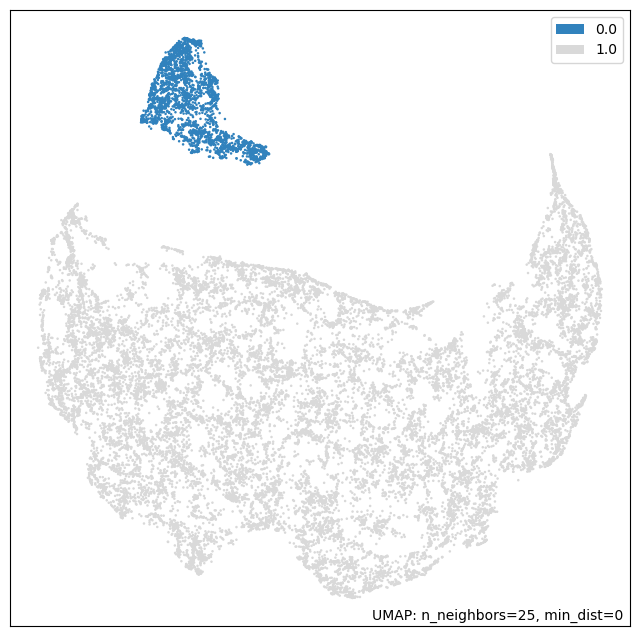

In [8]:
fig = umap.plot.points(df_mapper, labels = df_whole_labeled[:, -1], theme = "green").get_figure()

In [9]:
clusters = au.write_clusters(df_whole_labeled, -1)
for cluster in clusters.values():
    print(cluster.shape)

(2741, 2)
(20121, 2)
(0, 2)


# Classification 

Below we display the results of cell classification by UMAP and HDBSCAN. Each code cell plots a sample of ROI's from one cluster. Each cluster has been created by UMAP and HDBSCAN in a way such that ROI's within the same cluster share similar properties. 

Mitotic

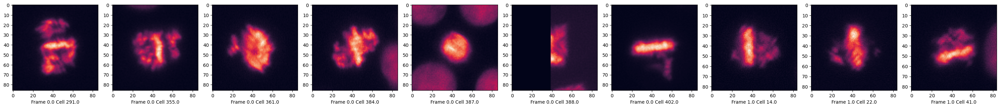

In [10]:
fig, ax = plt.subplots(ncols = 10, figsize = (30,20))

for i in range(10):
    ax[i].imshow(instance_whole.roi[int(clusters[0][i+10, 0])][int(clusters[0][i+10, 1])], cmap = 'rocket')
    ax[i].set_xlabel(f'Frame {clusters[0][i+10, 0]} Cell {clusters[0][i+10, 1]}')

plt.tight_layout()
plt.show()

Non-mitotic

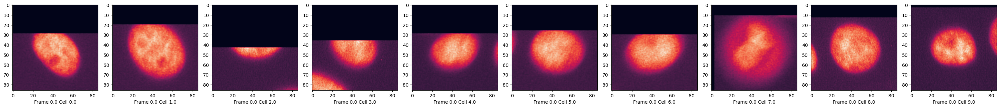

In [11]:
fig, ax = plt.subplots(ncols = 10, figsize = (30,30))

for i in range(10):
    ax[i].imshow(instance_whole.roi[int(clusters[1][i, 0])][int(clusters[1][i, 1])], cmap = 'rocket')
    ax[i].set_xlabel(f'Frame {clusters[1][i, 0]} Cell {clusters[1][i, 1]}')

plt.tight_layout()
plt.show()

# SAM (Segment Anything Model)

We will now display the automatically generated cell segmentations produced by SAM, these segmentations can be used to train a specialized network algorithm. 

In [12]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='red', facecolor=(0,0,0,0), lw=1))
    

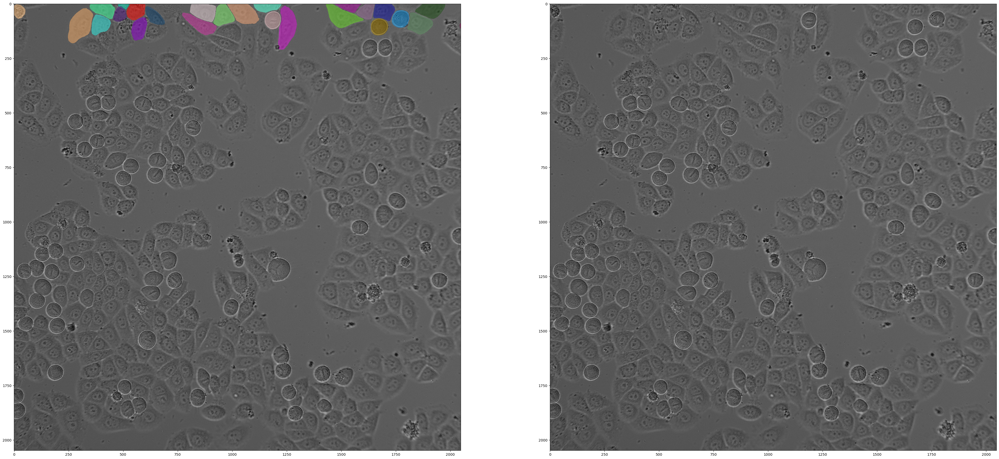

In [13]:
fig, ax = plt.subplots(ncols = 2, figsize = (50,50))

ax[0].imshow(au.bw_to_rgb(instance_whole.phase_image_stack[1]))
ax[1].imshow(au.bw_to_rgb(instance_whole.phase_image_stack[1]))
for i in range(25):
    mask = np.unpackbits(instance_whole.segmentations[1][i], axis = 0, count = 2048)
    mask = np.array([mask]).astype('uint8')
    show_mask(mask, ax[0], random_color = True)

plt.show()

# M-phase

As an exercise we will re-cluster the mitotic group to search for cells in the different stages of M phase. 

In [31]:
df_mitotic = df_whole_labeled[df_whole_labeled[:, -1] == 0]
df_mitotic = df_mitotic[:, 0:-1]

In [32]:
recluster_mapper = umap.UMAP(n_neighbors=8,
                   min_dist=0,
                   n_components=2,
                   random_state=42,).fit(df_mitotic)

recluster_embedding = umap.UMAP(n_neighbors=8,
                                  min_dist=0,
                                  n_components=2,
                                  random_state=42,
                                 ).fit_transform(df_mitotic)

/home/anishjv/.local/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/anishjv/.local/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [33]:
labeled_recluster_embedding = hdbscan.HDBSCAN(min_samples=10,
                                        min_cluster_size = int((1/10) * df_mitotic.shape[0]),
                                        ).fit_predict(recluster_embedding)

df_mitotic_labeled = au.add_labels(df_mitotic, labeled_recluster_embedding)

In [34]:
i=0
for entry in df_whole_labeled:
    if entry[-1] == 0:
        if df_mitotic_labeled[i, -1] != -1:
            entry[-1] = df_mitotic_labeled[i, -1] + 1
        else:
            entry[-1] = df_mitotic_labeled[i, -1]
        i+=1

IndexError: index 2741 is out of bounds for axis 0 with size 2741

In [ ]:
fig = umap.plot.points(recluster_mapper, labels = df_mitotic_labeled[:, -1], theme = "green").get_figure()

In [ ]:
mphase_clusters = au.write_clusters(df_mitotic_labeled, -1)
for cluster in mphase_clusters.values():
    print(cluster.shape)

In [ ]:
fig, ax = plt.subplots(ncols = 50, figsize = (150, 150))

for i in range(50):
    ax[i].imshow(instance_whole.roi[int(mphase_clusters[0][i, 0])][int(mphase_clusters[0][i, 1])])
    ax[i].set_xlabel(f'Frame_{mphase_clusters[0][i, 0]}_cell_{mphase_clusters[0][i, 1]}')

plt.show()

In [ ]:
fig, ax = plt.subplots(ncols = 50, figsize = (150, 150))

for i in range(50):
    ax[i].imshow(instance_whole.roi[int(mphase_clusters[1][i, 0])][int(mphase_clusters[1][i, 1])])
    ax[i].set_xlabel(f'Frame_{mphase_clusters[1][i, 0]}_cell_{mphase_clusters[1][i, 1]}')

plt.show()

In [ ]:
fig, ax = plt.subplots(ncols = 50, figsize = (150, 150))

for i in range(50):
    ax[i].imshow(instance_whole.roi[int(mphase_clusters[2][i, 0])][int(mphase_clusters[2][i, 1])])
    ax[i].set_xlabel(f'Frame_{mphase_clusters[2][i, 0]}_cell_{mphase_clusters[2][i, 1]}')

plt.show()

In [ ]:
fig, ax = plt.subplots(ncols = 50, figsize = (150, 150))

for i in range(50):
    ax[i].imshow(instance_whole.roi[int(mphase_clusters["noise"][i, 0])][int(mphase_clusters["noise"][i, 1])])
    ax[i].set_xlabel(f'Frame_{mphase_clusters["noise"][i, 0]}_cell_{mphase_clusters["noise"][i, 1]}')

plt.show()

# Balancing the Dataset

Above you may have noticed that df_whole contains some extreme class imbalance $\approx
$ 14,000 non-mitotic vs. $\approx$ 3,000 mitotic. 

We'll aim to fix that issue by creating extra annotations from an experiment where HeLa cells were treated with GSK (a drug that challenged cell division and leads to a prolonged metaphase arrest). 

We follow the standard protocol here of "1 experiment, 1 metric". Since this experiment differs from the experiment used to generate the data contained in df_whole, we will not attempt to use our previous metric

In [24]:
configs = cfg.Cfg.get_config()
configs.frame_step = 1
configs.threshold_type = 'multi'
configs.iou_thresh = 0.85

def sd_intensity(regionmask, intensity_image):
        return np.std(intensity_image[regionmask])


instance_gsk = ann.Annotator.get(configs, 
                                         [
                                             '/nfs/turbo/umms-ajitj/anishjv/data_movies/mCh.tif'
                                         ],
                                          [
                                              '/nfs/turbo/umms-ajitj/anishjv/data_movies/20221216_CyclinB-GSK_CDH_105.tif'
                                          ]
                                         )

df_gsk = instance_gsk.crop(predictor = predictor).gen_df(extra_props = (sd_intensity, ))

The bounding box side length was 89.98929396271713 pixels
The bounding box side length was 85.92878520627951 pixels
The bounding box side length was 84.11295131539748 pixels
The bounding box side length was 82.5952554660207 pixels
The bounding box side length was 81.78319373424144 pixels
The bounding box side length was 100.8032080510468 pixels
The bounding box side length was 90.58563371604168 pixels
The bounding box side length was 90.29016173207299 pixels
The bounding box side length was 99.22546387543301 pixels
The bounding box side length was 97.2799043784714 pixels
The bounding box side length was 89.18693530022355 pixels
The bounding box side length was 80.98733965048353 pixels


In [25]:
gsk_mapper = umap.UMAP(n_neighbors=50,
                   min_dist=0.0,
                   n_components=2,
                   random_state=42,).fit(df_gsk)

gsk_embedding = umap.UMAP(n_neighbors=50,
                                  min_dist=0.0,
                                  n_components=2,
                                  random_state=42,
                                 ).fit_transform(df_gsk)


/home/anishjv/.local/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/anishjv/.local/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [26]:
gsk_labels = hdbscan.HDBSCAN(min_samples=5,
                         min_cluster_size = int( (1/50) * df_gsk.shape[0]),
                        ).fit_predict(gsk_embedding)




df_gsk_labeled = au.add_labels(df_gsk, gsk_labels)


In [27]:
clusters_gsk = au.write_clusters(df_gsk_labeled, -1)

for cluster in clusters_gsk.values():
    print(cluster.shape)

(220, 2)
(412, 2)
(1141, 2)
(5961, 2)
(0, 2)


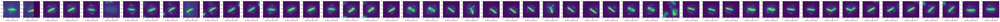

In [28]:
fig, ax = plt.subplots(ncols = 50, figsize = (150,150))

for i in range(50):
    ax[i].imshow(instance_gsk.roi[int(clusters_gsk[0][i, 0])][int(clusters_gsk[0][i, 1])])
    ax[i].set_xlabel(f'Frame_{clusters_gsk[0][i, 0]}_cell_{clusters_gsk[0][i, 1]}')

plt.show()

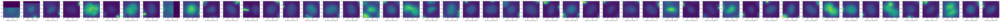

In [29]:
fig, ax = plt.subplots(ncols = 50, figsize = (150,150))

for i in range(50):

    ax[i].imshow(instance_gsk.roi[int(clusters_gsk[1][i, 0])][int(clusters_gsk[1][i, 1])])
    ax[i].set_xlabel(f'Frame_{clusters_gsk[1][i, 0]}_cell_{clusters_gsk[1][i, 1]}')

plt.show()

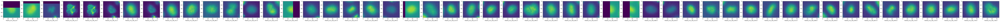

In [30]:
fig, ax = plt.subplots(ncols = 50, figsize = (150,150))

for i in range(50):
    ax[i].imshow(instance_gsk.roi[int(clusters_gsk[2][i, 0])][int(clusters_gsk[2][i, 1])])
    ax[i].set_xlabel(f'Frame_{clusters_gsk[2][i, 0]}_cell_{clusters_gsk[2][i, 1]}')

plt.show()

Note above that HDBSCAN spat out more than 2 clusters, in this case you must display the cluster and decifer which are mitotic, and which are non-mitotic. Here we see that HDBSCAN found 3 different clusters of non-mitotic cells that differ in size. 

In [42]:
for i in range(df_gsk_labeled.shape[0]):
    if df_gsk_labeled[i, -1] in [0, 2]:
        df_gsk_labeled[i, -1] = 1 #mitotic
    else:
        df_gsk_labeled[i, -1] = 0 #non-mitotic

# Writing a Dataset

In [43]:
df_gsk_labeled[:, -3] += 32 #adjusting the frame number of df_gsk to avoid duplication

In [45]:
phase_image_stack = np.concatenate(
    (instance_whole.phase_image_stack,
    instance_gsk.phase_image_stack),
    axis = 0
)


segmentations = np.concatenate(
    (instance_whole.segmentations, 
    instance_gsk.segmentations), 
    axis = 0
)

df_final_labeled = np.concatenate(
    (df_whole_labeled, df_gsk_labeled),
    axis = 0
)

splits = [
    (0, 5),
    (6, 15),
    (16, 44),
]

dw.write_dataset_ranges(
    '/home/anishjv/cell_seg_classify/',
    phase_image_stack,
    segmentations,
    df_final_labeled,
    splits,
    'coco_conv_dataset_2.2',
    {1: 'mitotic', 0: 'nonmitotic'}
)

# Writing Files / Extracting UMAP coordinates

A breif aside on saving the annotations you have just generated in various formats

In [ ]:
def write_roi_jpg_by_frame(parent_dir, roi, 
                           umap_embedding, data_labels, 
                           frame_count, cell_count, 
                           name, pad_size = 60, text = True):
    '''
    Saves each ROI as a .jpg file containing it's UMAP coordinates and and Cluster
    ------------------------------------------------------------------------------
    INPUTS:
        parent_dir: string, parent directory where sub directories are to be made
        roi: dict: dictionary containing ROI images as n-darrays
        umap_embedding: n-darray, (N, 2) array containing coordinates for each data point of the umap embeddng
        data_labels: n-darray, array containing cluster labels for each data point
        frame_count: int, number of frames from which ROIs were cropped
        cell_count: dict, dictionary containing the number of cells on each frame, keys are of the form 'Frame_i'
        pad_size: int, pixel width of border to add to each ROI
    
    '''
    
    main_path = os.path.join(parent_dir, name)
    os.mkdir(main_path)
    total_cell_count = 0
    
    for i in range(frame_count):
        frame_path = os.path.join(main_path, f'frame_{i}')
        os.mkdir(frame_path)
        os.chdir(frame_path)
        
        for j in range(cell_count[f'Frame_{i}']):
            if total_cell_count < umap_embedding.shape[0]:
                
                text_line_1 = ' EC:' + str(umap_embedding[total_cell_count])
                text_line_2 = '\n Cluster: ' + str(data_labels[total_cell_count, -1])
                
                img = cv2.copyMakeBorder(
                    roi[f'Frame_{int(data_labels[total_cell_count, -3])}_cell_{int(data_labels[total_cell_count, -2])}'], 
                    pad_size, pad_size, pad_size, pad_size, 
                    cv2.BORDER_CONSTANT)
                
                img = Image.fromarray(dt.bw_to_rgb(img))
                
                if text == True:
                    img_e = ImageDraw.Draw(img)
                    img_e.text((10,10), 
                               text_line_1 + text_line_2, 
                               fill=255)
                
                img.save(f"Frame_{int(data_labels[total_cell_count, -3])}_cell_{int(data_labels[total_cell_count, -2])}.jpg")
                
                total_cell_count += 1
                

            

In [ ]:
def write_roi_jpg_by_cluster(parent_dir, roi, 
                             umap_embedding, data_labels, 
                             frame_count, cell_count, 
                             name, pad_size = 60, text = True):
    
    '''
    Saves each ROI as a .jpg file containing it's UMAP coordinates and and Cluster
    ------------------------------------------------------------------------------
    INPUTS:
        parent_dir: string, parent directory where sub directories are to be made
        roi: dict: dictionary containing ROI images as n-darrays
        umap_embedding: n-darray, (N, 2) array containing coordinates for each data point of the umap embeddng
        data_labels: n-darray, array containing cluster labels for each data point
        frame_count: int, number of frames from which ROIs were cropped
        cell_count: dict, dictionary containing the number of cells on each frame, keys are of the form 'Frame_i'
        pad_size: int, pixel width of border to add to each ROI
    
    '''
    
    main_path = os.path.join(parent_dir, name)
    os.mkdir(main_path)
    total_cell_count = 0
    
    for i in range( int(data_labels[:, -1].max() + 1) ):
        cluster_path = os.path.join(main_path, f'cluster_{i}')
        os.mkdir(cluster_path)
    
    for k in range(frame_count):
        for j in range(cell_count[f'Frame_{k}']):
            if total_cell_count < umap_embedding.shape[0]:

                text_line_1 = ' EC:' + str(umap_embedding[total_cell_count])
                text_line_2 = '\n Cluster: ' + str(data_labels[total_cell_count, -1])

                img = cv2.copyMakeBorder(
                    roi[f'Frame_{int(data_labels[total_cell_count, -3])}_cell_{int(data_labels[total_cell_count, -2])}'], 
                    pad_size, pad_size, pad_size, pad_size, 
                    cv2.BORDER_CONSTANT)

                img = Image.fromarray(dt.bw_to_rgb(img))

                if text == True:
                    img_e = ImageDraw.Draw(img)
                    img_e.text((10,10), 
                               text_line_1 + text_line_2, 
                               fill=255)

                if data_labels[total_cell_count, -1] == 0:
                    cluster_0_path = os.path.join(main_path, 'cluster_0')
                    os.chdir(cluster_0_path)
                elif data_labels[total_cell_count, -1] == 1:
                    cluster_1_path = os.path.join(main_path, 'cluster_1')
                    os.chdir(cluster_1_path)
                elif data_labels[total_cell_count, -1] == 2:
                    cluster_2_path = os.path.join(main_path, 'cluster_2')
                    os.chdir(cluster_2_path)


                img.save(f"Frame_{int(data_labels[total_cell_count, -3])}_cell_{int(data_labels[total_cell_count, -2])}.jpg")

                total_cell_count += 1
                
